# Using YoloV5 Model for Object Detection  

## Install Dependencies

In [ ]:
# Clone the repo
!git clone https://github.com/ultralytics/yolov5  # clone repo
# Change directory to cloned YOLOv5 folder
%cd yolov5
# Install dependencies
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 12122, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 12122 (delta 13), reused 26 (delta 12), pack-reused 12093
Receiving objects: 100% (12122/12122), 11.92 MiB | 24.23 MiB/s, done.
Resolving deltas: 100% (8386/8386), done.
/content/yolov5
     |████████████████████████████████| 596 kB 7.6 MB/s 


## Import Requirements

In [ ]:
import torch
from IPython.display import Image, clear_output   # for displaying images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
# Unzipping our dataset
!unzip -q /content/drive/MyDrive/datasets/dataset_yolov5.zip -d ../

### Folder structure
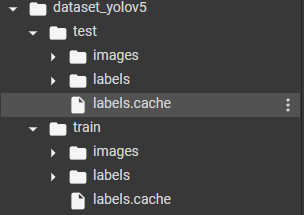

## Training

In [ ]:
# Train YOLOv5s on our dataset for 3 epochs
# --img : Image size
# --batch : Batch size
# --epochs : Epochs
# --data : Set the path to our yaml file
# --weights : Specify a custom path to weights
# --nosave : Only save the final checkpoint
# --cache: Cache images for faster training

!python train.py --img 416 --batch 4 --epochs 30 --data custom_data.yaml --weights yolov5x.pt --nosave --cache

train: weights=yolov5x.pt, cfg=, data=custom_data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=4, imgsz=416, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-235-g632559b Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degree

## Results
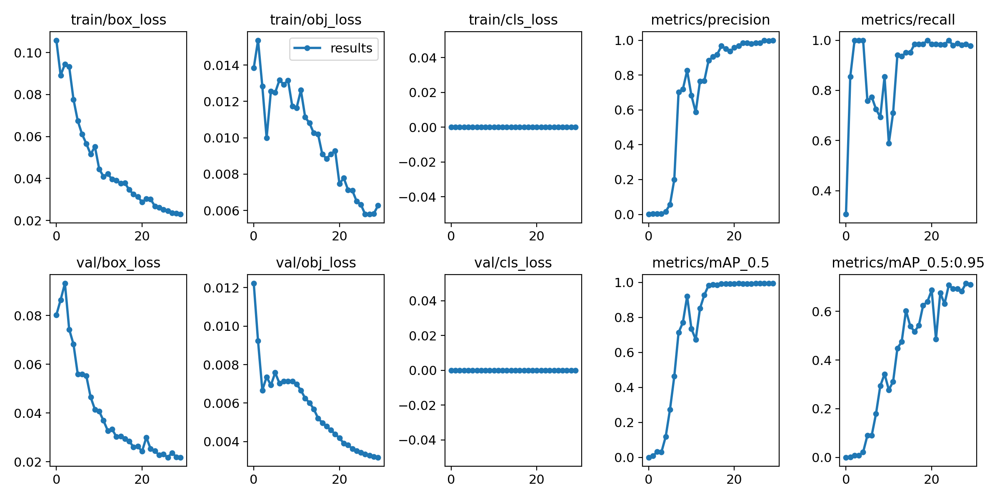

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

 ## Running Inference With Trained Weights

In [ ]:
%cd /content/yolov5
# Using our own weight file after the training
!python detect.py --weights /content/yolov5/runs/train/exp4/weights/last.pt --img 416 --conf 0.4 --source /content/dataset_yolov5/test/images

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp4/weights/last.pt'], source=/content/dataset_yolov5/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-235-g632559b Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 444 layers, 86173414 parameters, 0 gradients, 204.0 GFLOPs
image 1/62 /content/dataset_yolov5/test/images/letgo_105_jpg.rf.deefdc4f97f10e77f3a39dd6313b58cd.jpg: 416x416 1 license-plate, Done. (0.050s)
image 2/62 /content/dataset_yolov5/test/images/letgo_114_jpg.rf.5bd1895ce67386e3500ba8745e1d7d3f.jpg: 416x416 1 license-plate, Done. (0.050s)
image 3/62 /content/datase

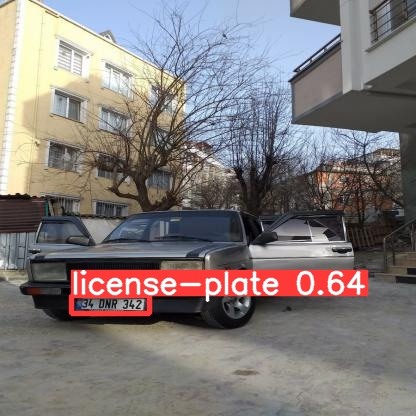

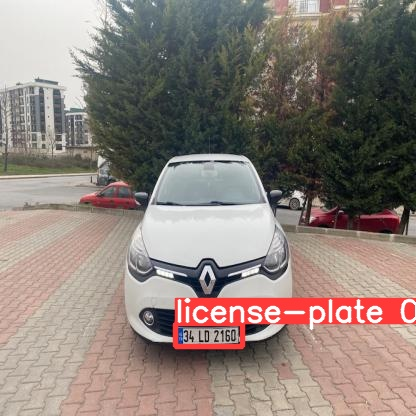

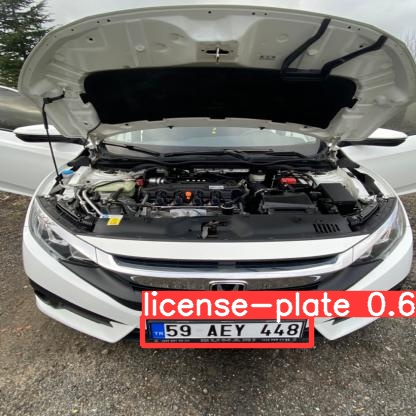

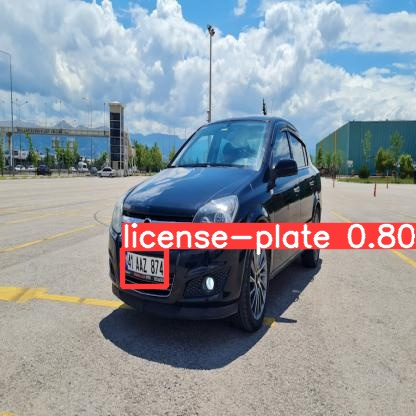

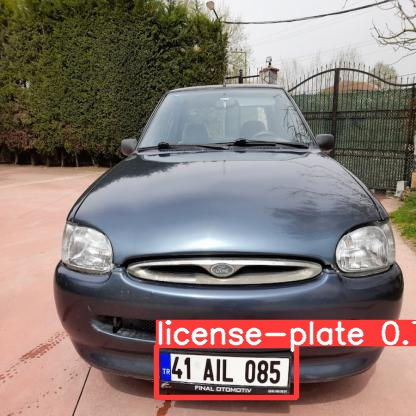

...

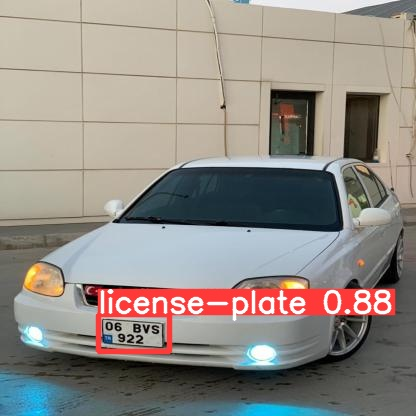

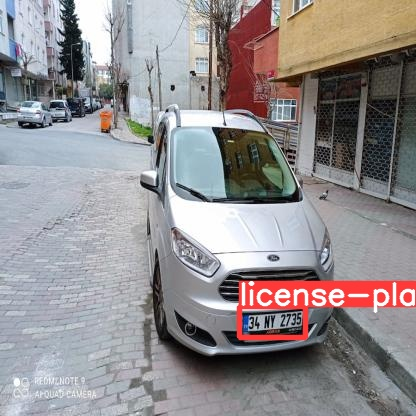

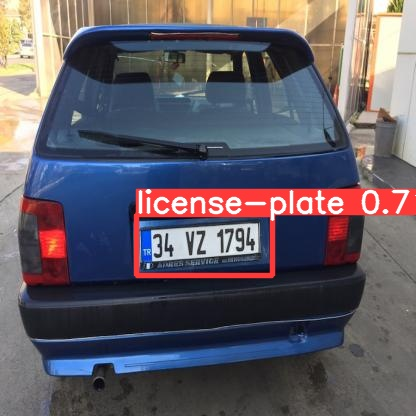

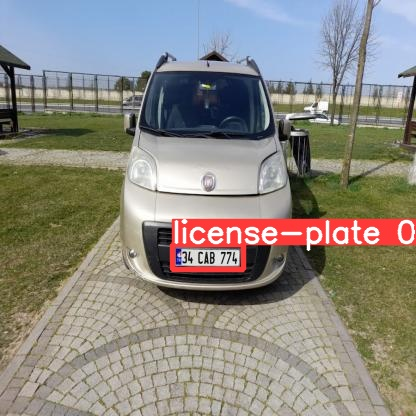

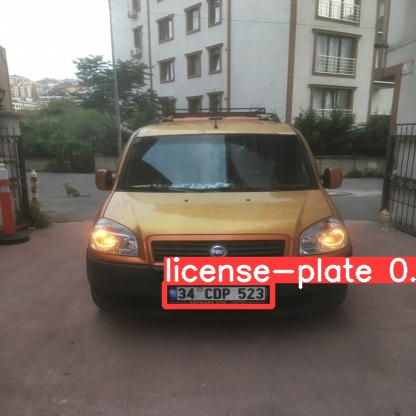

In [ ]:
# Display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")